In [1]:
%matplotlib inline


Basic nilearn example: manipulating and looking at data
=======================================================

A simple example showing how to load an existing Nifti file and use
basic nilearn functionalities.



In [4]:
# Let us download a simple example file
from nilearn import datasets
data = datasets.fetch_neurovault_motor_task()

nifti_file = data.images[0]

# Note that the variable nifti_file is just a path to a Nifti file
nifti_file

'/home/varoquau/nilearn_data/neurovault/collection_658/image_10426.nii.gz'

A first step: looking at our data
----------------------------------

Let's quickly plot this file:



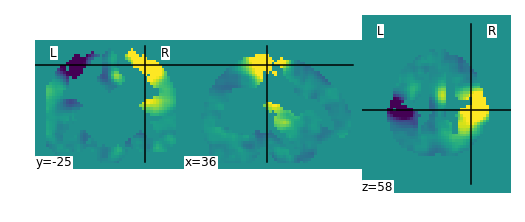

In [5]:
from nilearn import plotting
plotting.plot_img(nifti_file)

This is not a very pretty plot. We just used the simplest possible
code. There is a whole `section of the documentation`
on making prettier images.



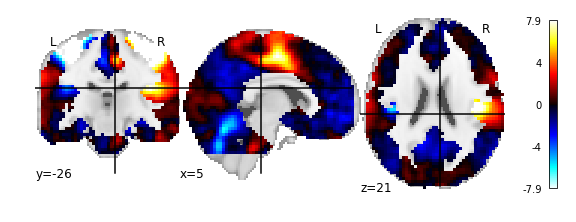

In [6]:
plotting.plot_stat_map(nifti_file)


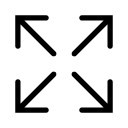

In [7]:
plotting.view_stat_map(nifti_file)

In [8]:
plotting.view_img_on_surf(nifti_file)

**Exercise**: Try plotting one of your own files. In the above,
nifti_file is nothing more than a string with a path pointing to
a nifti image. You can replace it with a string pointing to a file on
your disk. Note that it should be a 3D volume, and not a 4D volume.

Simple image manipulation: smoothing
-------------------------------------

Let's use an image-smoothing function from nilearn: `nilearn.image.smooth_img`

Functions containing 'img' can take either a filename or an image as input.

Here we give as inputs the image filename and the smoothing value in mm



In [11]:
from nilearn import image
smooth_nifti_img = image.smooth_img(nifti_file, fwhm=3)

# While we are giving a file name as input, the function returns
# an in-memory object:
print(smooth_nifti_img)

<class 'nibabel.nifti1.Nifti1Image'>
data shape (53, 63, 46)
affine: 
[[  -3.    0.    0.   78.]
 [   0.    3.    0. -112.]
 [   0.    0.    3.  -50.]
 [   0.    0.    0.    1.]]
metadata:
<class 'nibabel.nifti1.Nifti1Header'> object, endian='<'
sizeof_hdr      : 348
data_type       : b''
db_name         : b''
extents         : 0
session_error   : 0
regular         : b''
dim_info        : 0
dim             : [ 3 53 63 46  1  1  1  1]
intent_p1       : 0.0
intent_p2       : 0.0
intent_p3       : 0.0
intent_code     : none
datatype        : float32
bitpix          : 32
slice_start     : 0
pixdim          : [-1.  3.  3.  3.  1.  1.  1.  1.]
vox_offset      : 0.0
scl_slope       : nan
scl_inter       : nan
slice_end       : 0
slice_code      : unknown
xyzt_units      : 0
cal_max         : 7.941345
cal_min         : -7.941444
slice_duration  : 0.0
toffset         : 0.0
glmax           : 0
glmin           : 0
descrip         : b''
aux_file        : b''
qform_code      : unknown
sform_code   

This is an in-memory object. We can pass it to nilearn function, for
instance to look at it



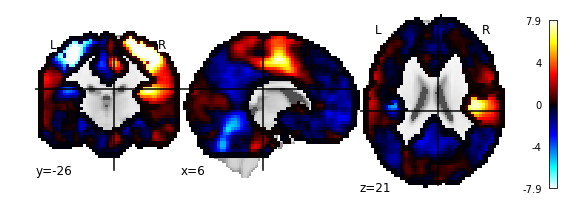

In [12]:
plotting.plot_stat_map(smooth_nifti_img)

We could also pass it to the smoothing function



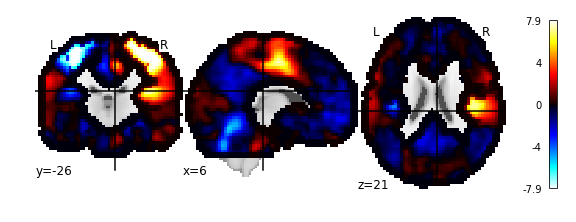

In [13]:
more_smooth_nifti_img = image.smooth_img(smooth_nifti_img, fwhm=3)
plotting.plot_stat_map(more_smooth_nifti_img)

Saving results to a file
-------------------------

We can save any in-memory object as follows:



In [14]:
more_smooth_nifti_img.to_filename('more_smooth_nifti_img.nii.gz')

4D nifti images and indexing them
========================

index_img and iter_img

In [17]:
rsn = datasets.fetch_atlas_smith_2009()
ica_maps = rsn.rsn20
print(ica_maps)

/home/varoquau/nilearn_data/smith_2009/rsn20.nii.gz


In [18]:
image.load_img(ica_maps).shape

(91, 109, 91, 20)

What's the number of volumes in this image?

We can extra volumes as follows

In [19]:
image.index_img(ica_maps, [0, 2, 4])

We can iterate on volumes as follows:

In [21]:
for img in image.iter_img(ica_maps):
    print(img.shape)

(91, 109, 91)
(91, 109, 91)
(91, 109, 91)
(91, 109, 91)
(91, 109, 91)
(91, 109, 91)
(91, 109, 91)
(91, 109, 91)
(91, 109, 91)
(91, 109, 91)
(91, 109, 91)
(91, 109, 91)
(91, 109, 91)
(91, 109, 91)
(91, 109, 91)
(91, 109, 91)
(91, 109, 91)
(91, 109, 91)
(91, 109, 91)
(91, 109, 91)
